In [15]:
from sahi.utils.file import download_from_url
from sahi.utils.yolov8 import download_yolov8s_model

# Download YOLOv8 model
yolov8_model_path = "final/best.pt"
img_path = "final/261.png"
# download_yolov8s_model(yolov8_model_path)

In [17]:
from sahi import AutoDetectionModel

detection_model = AutoDetectionModel.from_pretrained(
    model_type="yolov8",
    model_path=yolov8_model_path,
    confidence_threshold=0.0,
    device="cpu",  # or 'cuda:0'
)

TypeError: ('model_path is not a valid yolov8 model path: ', FileNotFoundError(2, 'No such file or directory'))

In [ ]:
from sahi.predict import get_prediction

# With an image path
result = get_prediction(img_path, detection_model)

# With a numpy image
result = get_prediction(read_image(img_path), detection_model)

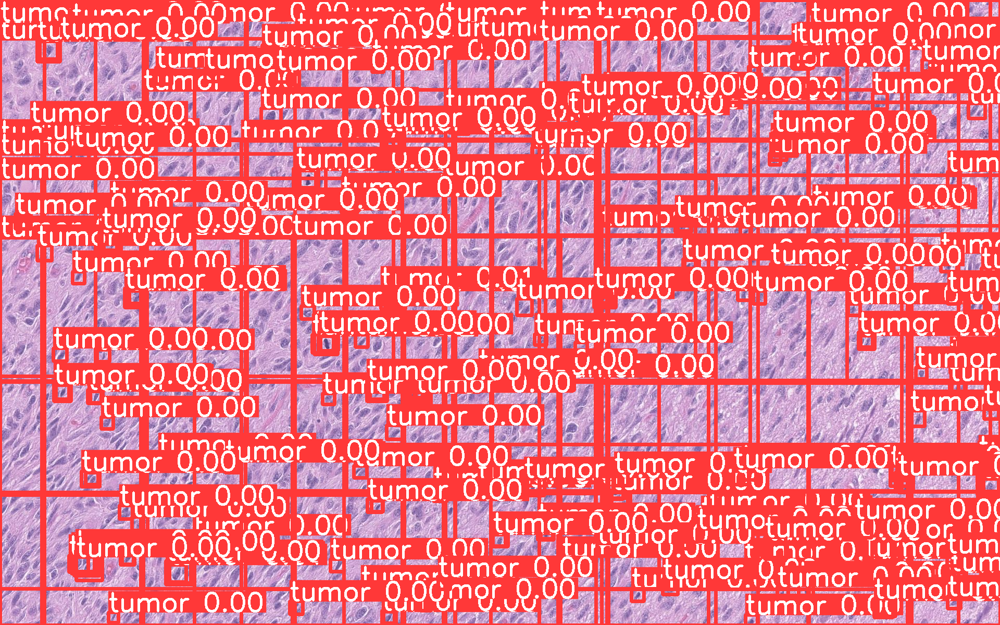

In [368]:
from PIL import Image

result.export_visuals(export_dir="final/result/")
Image.open("final/result/prediction_visual.png")
# im.show()

In [360]:
from sahi.predict import get_sliced_prediction

result = get_sliced_prediction(
    img_path,
    detection_model,
    slice_height=64,
    slice_width=64,
    overlap_height_ratio=0.2,
    overlap_width_ratio=0.2,
    # slice_export_prefix="test",
    # slice_dir="final/result/1"
)

Performing prediction on 851 slices.


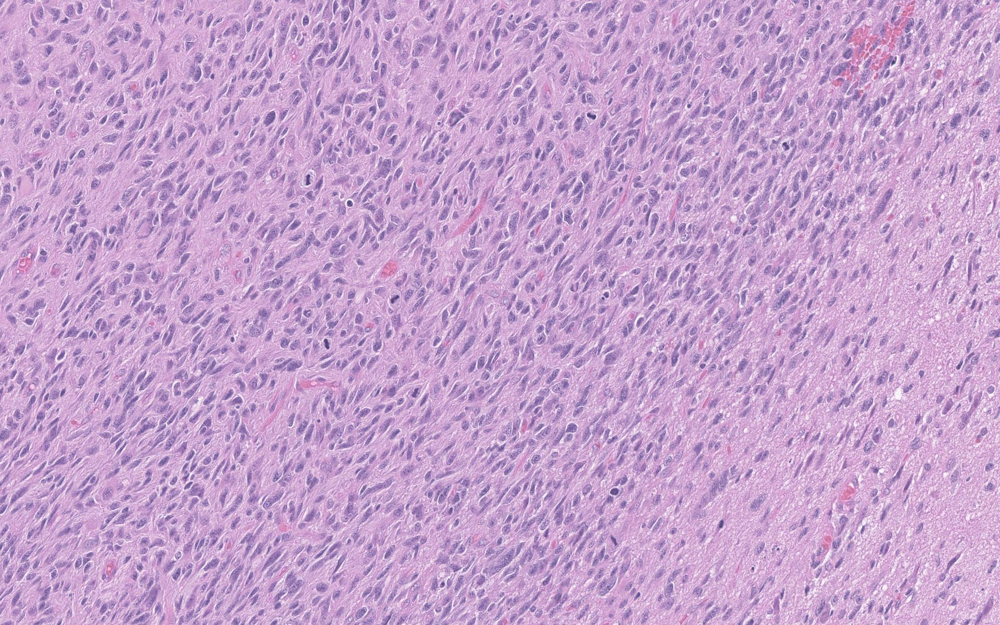

In [362]:
print(result)
result.export_visuals(export_dir="final/result/")

Image.open("final/result/prediction_visual.png")

In [64]:
pip install patched_yolo_infer

Note: you may need to restart the kernel to use updated packages.


In [72]:
pip install PyQt5

Note: you may need to restart the kernel to use updated packages.


In [225]:
import cv2
from patched_yolo_infer import MakeCropsDetectThem, CombineDetections
from patched_yolo_infer import visualize_results

# Load the image 
img_path = "final/7.png"
img = cv2.imread(img_path)

element_crops = MakeCropsDetectThem(
    image=img,
    model_path=yolov8_model_path,
    segment=False,
    shape_x=640,
    shape_y=640,
    overlap_x=50,
    overlap_y=50,
    conf=0.5,
    iou=0.7,
    resize_initial_size=True,
)
result = CombineDetections(element_crops, nms_threshold=0.05, match_metric='IOS')  

# # Final Results:
# img=result.image
# confidences=result.filtered_confidences
# boxes=result.filtered_boxes
# masks=result.filtered_masks
# classes_ids=result.filtered_classes_id
# classes_names=result.filtered_classes_names

# Visualizing the results using the visualize_results function
visualize_results(
    img=result.image,
    confidences=result.filtered_confidences,
    boxes=result.filtered_boxes,
    masks=result.filtered_masks,
    classes_ids=result.filtered_classes_id,
    classes_names=result.filtered_classes_names,
    segment=False,
)

/opt/anaconda3/lib/python3.12/site-packages/patched_yolo_infer/functions_extra.py:424: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
